#**Food Vision**

##**Project Description: Building a CNN Model using Transfer Learning on the Food101 Dataset with EfficientNetV2B0**

## Check GPU

In [1]:
# Check GPU
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-851971eb-7475-6e07-1066-1c458313068f)


The NoteBook is running on Tesla T4 GPU provided by Google Collab

## Use TensorFlow Datasets to Download Data

In [2]:
# Import the required liberary
import tensorflow_datasets as tfds

In [3]:
# Load in the data
(train_data, test_data), ds_info = tfds.load(name="food101",
                                             split=["train", "validation"],
                                             shuffle_files=False, # keeping the shuffle off cause want to load the test data and it's label in order
                                             as_supervised=True,  # data gets returned in tuple format (data, labels)
                                             with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incomplete975QSH/food101-train.tfrecord*...:   0%|          …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incomplete975QSH/food101-validation.tfrecord*...:   0%|     …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


## Exploring the Food101 data from Tensorflow Datasets

In [4]:
# features of Food101 from TFDS
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [5]:
# Get the class nanes
class_names = ds_info.features["label"].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [6]:
# Take one sample of the train data
train_one_sample = train_data.take(1)
train_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [7]:
# Output info about our training sample
for image, label in train_one_sample:
  print(f"""
        Image shape: {image.shape}
        Image datatpe: {image.dtype}
        Target class from Food101 (tensor form): {label}
        Class name (str form): {class_names[label.numpy()]}
        """)


        Image shape: (512, 512, 3)
        Image datatpe: <dtype: 'uint8'>
        Target class from Food101 (tensor form): 56
        Class name (str form): huevos_rancheros
        


### Plot an image from tensorflow dataset

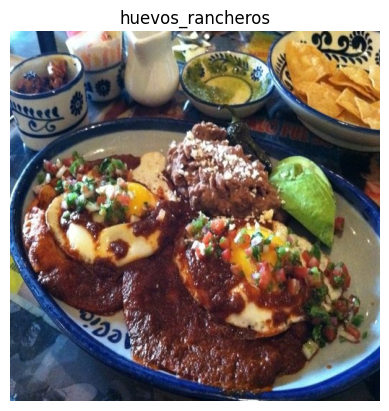

In [8]:
# Plot an image tensor
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.imshow(image)
plt.title(class_names[label.numpy()])
plt.axis(False);

## Create preprocessing functions for our datasets

In [9]:
import tensorflow as tf
def preprocess_img(image, label, img_shape=224):
  """
  Convert image data type from `uint8` -> `float32` and reshape
  image to [img_shape, img_shape, colour_channels]

  """
  image = tf.image.resize(image, size=[img_shape, img_shape])
  return tf.cast(image, tf.float32), label # return (float32_image, label) tuple

Our images are currently stored as data type `uint8`, but for TensorFlow, we need them to be of type `float32`.

In [10]:
# Preprocess a single sample image

preprocessed_img = preprocess_img(image, label)[0]

print(f"Image before preprocessing:\n {image[:2]}..., \nShape: {image.shape}, \nDataType: {image.dtype}\n")
print(f"Image after preprocessing:\n {preprocessed_img[:2]}..., \nShape: {preprocessed_img.shape}, \nDataType: {preprocessed_img.dtype}")

Image before preprocessing:
 [[[233 253 251]
  [231 253 250]
  [228 254 251]
  ...
  [ 85  82  89]
  [ 68  67  75]
  [ 57  57  67]]

 [[232 254 252]
  [229 254 251]
  [226 255 251]
  ...
  [121 116 120]
  [100  99 104]
  [ 86  85  91]]]..., 
Shape: (512, 512, 3), 
DataType: <dtype: 'uint8'>

Image after preprocessing:
 [[[230.65816 253.64285 251.     ]
  [222.99998 254.97449 252.19388]
  [207.06633 255.      250.36734]
  ...
  [140.66287 129.52519 121.22428]
  [121.14268 115.26515 116.95397]
  [ 83.95363  83.08119  89.63737]]

 [[221.47449 254.37755 253.33163]
  [214.5102  255.      253.92348]
  [198.41327 254.58673 251.96939]
  ...
  [208.66318 195.82143 173.40823]
  [197.03056 190.1071  174.83162]
  [175.54036 171.6169  161.21384]]]..., 
Shape: (224, 224, 3), 
DataType: <dtype: 'float32'>


## Batch and Preprocessing

Utilizing batches accelerates model training by allowing it to process data in manageable chunks, preventing RAM overload from attempting to load all images simultaneously. An optimal batch size is typically around `32`.

Employing prefetch with `tf.data.AUTOTUNE` enhances code efficiency, enabling smoother execution.

In [11]:
# Preprocess the training data using the preprocess_img function,
# leveraging parallelism for faster execution.
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)

In [12]:
# Shuffle train data and turn it into batches and prefetch it (load it faster)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

# Map preprocessing function for test data and turn it into batches
test_data = test_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

In [13]:
# Display test and Train Data
test_data, train_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

The train_data dataset consists of batches of preprocessed images and their corresponding labels,
with the image tensors having a shape of `(batch_size, 224, 224, 3)` and data type `float32`,
and the label tensors having a shape of `(batch_size,)` and data type `int64`.

Similarly, the test_data dataset contains batches of preprocessed test images and their labels,
following the same tensor specifications as train_data.

## Create Model Callbacks

In [14]:
# Creating Model Checkpoint

checkpoint_path = "Model_Checkpoin/cp.ckpt"

# Define a ModelCheckpoint callback to save the best model weights based on validation accuracy.
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor="val_accuracy",
                                                      sav_weights_only=True, # Save only the model weights.
                                                      save_best_only=True, # Save only the best model.
                                                      verbose=0)

# Import the datetime library
import datetime

# Create TensorBoard Call back
def create_tensorboard_callback(dir_name, experiment_name):
  """
    Create a TensorBoard callback for visualizing training metrics.

    Args:
    - dir_name: Directory name where logs will be stored.
    - experiment_name: Name of the experiment.

    Returns:
    - tensorboard_callback: TensorBoard callback object.
    """
  # Create a unique log directory based on current timestamp
  log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

  # Create TensorBoard callback
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

  return tensorboard_callback

## Setup mixed precision training

In [15]:
# Turn on mixed precsion training
from tensorflow.keras import mixed_precision

# Enable mixed precision training for faster and more memory-efficient computations
mixed_precision.set_global_policy("mixed_float16")

## Creating a Feature Extraction Model

In [16]:
from tensorflow.keras import layers

In [17]:
# Load pre-trained EfficientNetV2B0 model without top classification layer
base_model = tf.keras.applications.EfficientNetV2B0(include_top=False)

# Freeze the weights of the pre-trained model
base_model.trainable = False

# Create functional model
inputs = layers.Input(shape=(224,224,3), name="input_layer")

# Create input layer
x = base_model(inputs, training=False)

# Pass input through the pre-trained model with training set to False to keep it in inference mode
x = layers.GlobalAveragePooling2D()(x)

# Add global average pooling layer to reduce spatial dimensions
x = layers.Dense(len(class_names))(x)

# Add output layer with softmax activation for classification
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name="output_layer")(x)

# Create the functional model
model_0 = tf.keras.Model(inputs, outputs)

# Compile the Model
# Compile the model with appropriate loss, optimizer, and metrics
model_0.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])


24274472/24274472 [==============================] - 0s 0us/step


In [18]:
# Display a summary of the model architecture, including layer names, output shapes, and number of parameters
model_0.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, None, None, 1280   5919312   
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 101)               129381    
                                                                 
 output_layer (Activation)   (None, 101)               0         
                                                                 
Total params: 6048693 (23.07 MB)
Trainable params: 129381 (50

In [19]:
# Loop through each layer in the model and print its name, data type, and data type policy
for layer in model_0.layers:
  print(layer.name, layer.dtype, layer.dtype_policy)

input_layer float32 <Policy "float32">
efficientnetv2-b0 float32 <Policy "mixed_float16">
global_average_pooling2d float32 <Policy "mixed_float16">
dense float32 <Policy "mixed_float16">
output_layer float32 <Policy "float32">


In [20]:
# Iterate through the layers of the second layer of model_0 and print the name, data type, and data type policy of each layer
for layer in model_0.layers[1].layers[:25]:
  print(layer.name, layer.dtype, layer.dtype_policy)

input_1 float32 <Policy "float32">
rescaling float32 <Policy "mixed_float16">
normalization float32 <Policy "mixed_float16">
stem_conv float32 <Policy "mixed_float16">
stem_bn float32 <Policy "mixed_float16">
stem_activation float32 <Policy "mixed_float16">
block1a_project_conv float32 <Policy "mixed_float16">
block1a_project_bn float32 <Policy "mixed_float16">
block1a_project_activation float32 <Policy "mixed_float16">
block2a_expand_conv float32 <Policy "mixed_float16">
block2a_expand_bn float32 <Policy "mixed_float16">
block2a_expand_activation float32 <Policy "mixed_float16">
block2a_project_conv float32 <Policy "mixed_float16">
block2a_project_bn float32 <Policy "mixed_float16">
block2b_expand_conv float32 <Policy "mixed_float16">
block2b_expand_bn float32 <Policy "mixed_float16">
block2b_expand_activation float32 <Policy "mixed_float16">
block2b_project_conv float32 <Policy "mixed_float16">
block2b_project_bn float32 <Policy "mixed_float16">
block2b_drop float32 <Policy "mixed_fl

## Fit the feature extraction model

In [21]:
# Fit the model_0 with specified parameters and callbacks
initial_epoch = 5
history_0 = model_0.fit(train_data,
                        epochs=initial_epoch,
                        steps_per_epoch = len(train_data),
                        validation_data = test_data,
                        validation_steps=int(0.15*len(test_data)),
                        callbacks=[create_tensorboard_callback(dir_name="Transfer_learning", experiment_name="Base_model_0"),
                                   model_checkpoint])

Epoch 1/5
2368/2368 [==============================] - 237s 94ms/step - loss: 1.7444 - accuracy: 0.5761 - val_loss: 1.1507 - val_accuracy: 0.6973
Epoch 2/5
2368/2368 [==============================] - 195s 82ms/step - loss: 1.2135 - accuracy: 0.6856 - val_loss: 1.0499 - val_accuracy: 0.7195
Epoch 3/5
2368/2368 [==============================] - 203s 85ms/step - loss: 1.0655 - accuracy: 0.7211 - val_loss: 1.0089 - val_accuracy: 0.7288
Epoch 4/5
2368/2368 [==============================] - 202s 84ms/step - loss: 0.9702 - accuracy: 0.7455 - val_loss: 0.9869 - val_accuracy: 0.7293
Epoch 5/5
2368/2368 [==============================] - 203s 84ms/step - loss: 0.8994 - accuracy: 0.7637 - val_loss: 0.9745 - val_accuracy: 0.7357


## Evaluating the Base Model

In [22]:
# Evaluate the performance of model_0 on the test dataset
model_0_evaluation = model_0.evaluate(test_data)

790/790 [==============================] - 52s 65ms/step - loss: 0.9684 - accuracy: 0.7355


Evaluate the performance of our base model with feature extraction on the test dataset, resulting in an accuracy of `0.7344.`

## Create a Custom Fuction to Plot Loss Curve

In [23]:
def plot_loss_curves(history):
  """
  Plot the loss and accurcay curves
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history['loss']))

  # Plot the loss curve
  plt.plot(epochs, loss, label="Training Loss")
  plt.plot(epochs, val_loss, label="Val Loss")
  plt.title("Loss Curve")
  plt.xlabel("Epcohs")
  plt.ylabel("loss")
  plt.legend()

  # Plot the accuracy curve
  plt.figure()
  plt.plot(epochs, accuracy, label="Training Accuracy")
  plt.plot(epochs, val_accuracy, label="Val Accuracy")
  plt.title("Accuracy Curve")
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.legend();

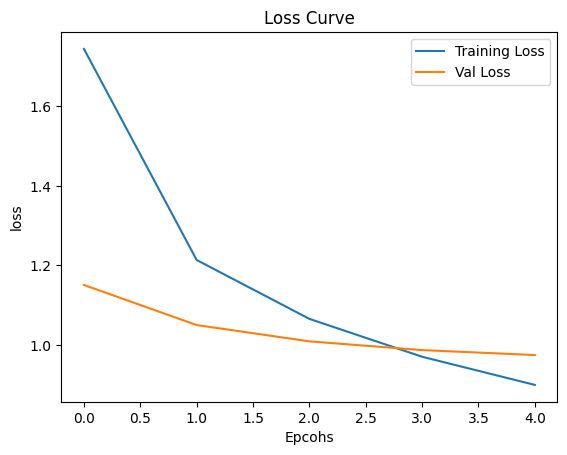

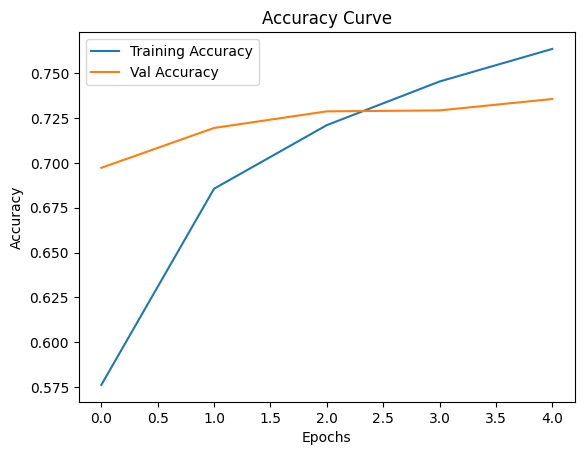

In [24]:
# Plot Loss Curve
plot_loss_curves(history_0)

### Let's Create a Custom Func that creates a Base Model

In [25]:
def create_model():
  # Load the pre-trained EfficientNetV2B0 model without the top classification layer
  base_model = tf.keras.applications.EfficientNetV2B0(include_top=False)

  # Freeze the weights of the pre-trained layers
  base_model.trainable = False

  # Define input layer
  inputs = layers.Input(shape=(224,224,3), name="input_layer")

  # Pass the input through the base model
  x = base_model(inputs, training=False)

  # Add GlobalAveragePooling2D layer
  x = layers.GlobalAveragePooling2D()(x)

  # Add a fully connected layer with the number of classes as the output dimension
  x = layers.Dense(len(class_names))(x)

  # Apply softmax activation to get probabilities for each class
  outputs = layers.Activation(activation="softmax", dtype=tf.float32, name="Output_layer")(x)

  # Construct the model with inputs and outputs
  model = tf.keras.Model(inputs, outputs)

  return model

In [26]:
# Create a new model using the `create_model` function and compile it with sparse categorical crossentropy loss, Adam optimizer, and accuracy metric.
created_model = create_model()

created_model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
                      optimizer=tf.keras.optimizers.Adam(),
                      metrics=["accuracy"])

## Loading weights of `model_0` to the base model created

In [27]:
# Load the weights of the model from the specified checkpoint path.
created_model.load_weights(checkpoint_path)

### Exploaring the layers of the created model

In [28]:
# Iterate through the layers of the created_model and print the name, trainable status, data type, and data type policy of each layer.
for layer in created_model.layers:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <Policy "float32">
efficientnetv2-b0 False float32 <Policy "mixed_float16">
global_average_pooling2d_1 True float32 <Policy "mixed_float16">
dense_1 True float32 <Policy "mixed_float16">
Output_layer True float32 <Policy "float32">


Our model has the mixed precision policy

### Comparing the Weight Loaded Model and Original Model evaluation score

In [29]:
# Evaluate the performance of the created_model on the test dataset.
created_model_evaluation = created_model.evaluate(test_data)

790/790 [==============================] - 51s 60ms/step - loss: 0.9684 - accuracy: 0.7355


In [30]:
# Compare the evaluation results of model_0 and created_model using NumPy's isclose function.
import numpy as np
np.isclose(model_0_evaluation, created_model_evaluation)

array([ True,  True])

## Fine Tune Model
For model 2 we will simply fine tune our base model `model_0` with all the layers in base as trainable.

Since our Goal is to just get an accuracy of about 80%.

Let's create some callbacks:
1. `EarlyStopping`
2. `ReduceLROnPlateau`

In [31]:
# Define callbacks for early stopping, reducing learning rate on plateau, and model checkpointing.
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-7, verbose=1)

# Model Checkpoint
checkpoint_path_1 = "Fine Tune Model/cp.ckpt"

# Define model checkpoint callback to save the best model weights based on validation accuracy.
model_checkpoint_callback_1 = tf.keras.callbacks.ModelCheckpoint(checkpoint_path_1,
                                                      monitor="val_accuracy",
                                                      sav_weights_only=True,
                                                      save_best_only=True,
                                                      verbose=0)

Let's recompile the model with lr of `0.0001`

In [32]:
# Unfreeze all the layers in base model
base_model.trainable = True

# Recompile the model

model_0.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
                          optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                          metrics=["accuracy"])

# Fitting the Model
finetune_epoch = 95 + initial_epoch
history_0_fine_tune = model_0.fit(train_data,
                                  epochs=finetune_epoch,
                                  validation_data=test_data,
                                  validation_steps=int(0.15*len(test_data)),
                                  initial_epoch=history_0.epoch[-1],
                                  callbacks=[create_tensorboard_callback(dir_name="Transfer_learning", experiment_name="FinTune_Base_Model_2"),
                                  reduce_lr, early_stopping])

Epoch 5/100
2368/2368 [==============================] - 369s 132ms/step - loss: 0.7996 - accuracy: 0.7821 - val_loss: 0.7782 - val_accuracy: 0.7844 - lr: 1.0000e-04
Epoch 6/100
2368/2368 [==============================] - 315s 132ms/step - loss: 0.4482 - accuracy: 0.8739 - val_loss: 0.7544 - val_accuracy: 0.8030 - lr: 1.0000e-04
Epoch 7/100
2368/2368 [==============================] - 318s 133ms/step - loss: 0.2190 - accuracy: 0.9373 - val_loss: 0.8479 - val_accuracy: 0.7932 - lr: 1.0000e-04
Epoch 8/100
2368/2368 [==============================] - ETA: 0s - loss: 0.1159 - accuracy: 0.9656
Epoch 8: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
2368/2368 [==============================] - 318s 133ms/step - loss: 0.1159 - accuracy: 0.9656 - val_loss: 1.0283 - val_accuracy: 0.7770 - lr: 1.0000e-04
Epoch 9/100
2368/2368 [==============================] - 317s 133ms/step - loss: 0.0270 - accuracy: 0.9937 - val_loss: 1.0025 - val_accuracy: 0.8061 - lr: 2.0000e-05
Epoch 

### Evaluate the Fine Tune Model

In [33]:
# Evaluate the fine-tuned model_0 on the test dataset.
finetune_result = model_0.evaluate(test_data)

790/790 [==============================] - 50s 63ms/step - loss: 1.1861 - accuracy: 0.8090


Let's Create a function to compare the history attributes of fine tune to feature extraction model

In [34]:
def compare_historys(original_history, new_history, initial_epochs=5):
    """
    Compares two TensorFlow model History objects.

    Args:
      original_history: History object from original model (before new_history)
      new_history: History object from continued model training (after original_history)
      initial_epochs: Number of epochs in original_history (new_history plot starts from here)
    """

    # Get original history measurements
    acc = original_history.history["accuracy"]
    loss = original_history.history["loss"]

    val_acc = original_history.history["val_accuracy"]
    val_loss = original_history.history["val_loss"]

    # Combine original history with new history
    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    # Make plots
    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

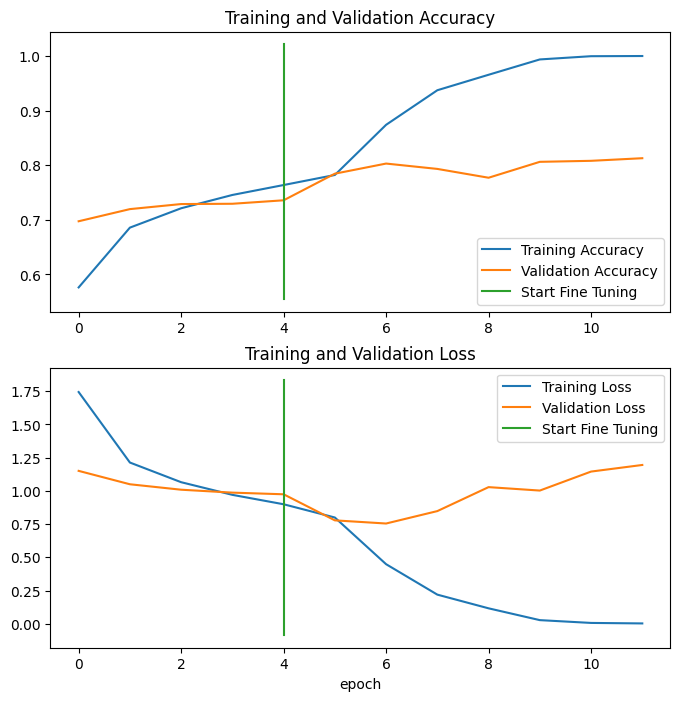

In [35]:
# Compare the histories
compare_historys(history_0, history_0_fine_tune)

As we can see our model is overfitting to the Training Data

## Let's Save the Model in our drive

In [37]:
# Let's Mount the Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define the directory to save the fine-tuned model
save_dir = "/content/drive/MyDrive/Food Vision FineTune"

# Save the fine-tuned model_0 to the specified directory
model_0.save(save_dir)

## Let's Load Our Saved Model and evaluate it once again

In [36]:
# Importing Relevnt Library
import tensorflow as tf

In [38]:
# Load the saved model from the specified directory
model = tf.keras.models.load_model("/content/drive/MyDrive/Food Vision FineTune")

In [39]:
# Evaluating loaded model and comparing it to our model
import numpy as np

load_model_evaluation = model.evaluate(test_data)

790/790 [==============================] - 52s 64ms/step - loss: 1.1623 - accuracy: 0.8095


In [40]:
# Checking the layer in the model

for layer in model.layers:
  print(layer.name, layer.trainable, layer.dtype_policy)

input_layer True <Policy "float32">
efficientnetv2-b0 True <Policy "mixed_float16">
global_average_pooling2d True <Policy "mixed_float16">
dense True <Policy "mixed_float16">
output_layer True <Policy "float32">


In [41]:
# Checking the layer in base model

for layer_number, layer in enumerate(model.layers[1].layers[:20]):
  print(layer_number, layer.name, layer.trainable, layer.dtype_policy)

0 input_1 True <Policy "float32">
1 rescaling True <Policy "mixed_float16">
2 normalization True <Policy "mixed_float16">
3 stem_conv True <Policy "mixed_float16">
4 stem_bn True <Policy "mixed_float16">
5 stem_activation True <Policy "mixed_float16">
6 block1a_project_conv True <Policy "mixed_float16">
7 block1a_project_bn True <Policy "mixed_float16">
8 block1a_project_activation True <Policy "mixed_float16">
9 block2a_expand_conv True <Policy "mixed_float16">
10 block2a_expand_bn True <Policy "mixed_float16">
11 block2a_expand_activation True <Policy "mixed_float16">
12 block2a_project_conv True <Policy "mixed_float16">
13 block2a_project_bn True <Policy "mixed_float16">
14 block2b_expand_conv True <Policy "mixed_float16">
15 block2b_expand_bn True <Policy "mixed_float16">
16 block2b_expand_activation True <Policy "mixed_float16">
17 block2b_project_conv True <Policy "mixed_float16">
18 block2b_project_bn True <Policy "mixed_float16">
19 block2b_drop True <Policy "mixed_float16">


## Let's Predict the `test_data` on our data

In [76]:
# Generate predictions (probabilities) on the test dataset using the model.
prediction_probs = model.predict(test_data)

790/790 [==============================] - 71s 88ms/step


In [80]:
# Extract the predicted labels by selecting the class index with the highest probability from the predicted probabilities array
predictions = prediction_probs.argmax(axis=1)

# Print the first 10 predicted labels
predictions[:10]

array([ 29,  81,  91,  53,  97,  97,  10,  31,   3, 100])

In [43]:
# Import numpy and initialize an empty array to store the labels
import numpy as np
y_labels = np.array([], dtype=np.int32)

# Iterate through the test_data to extract labels
for image, label in test_data.unbatch():
  y_labels = np.append(y_labels, label.numpy())

# Print the first 10 labels
y_labels[:10]

array([ 29,  81,  91,  53,  97,  97,  10,  31,   3, 100])

In [44]:
import os

# Directory to store images
save_dir = "images/"
os.makedirs(save_dir, exist_ok=True)

# Save images to disk
for i, (image, label) in enumerate(test_data.unbatch()):
    tf.keras.preprocessing.image.save_img(os.path.join(save_dir, f'image_{i}.png'), image)

## Evaluating our Fine Tune Model on different metrics

### Let's Create a Function that will plot a confussion matrix

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()
  plt.xticks(rotation=70)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [51]:
make_confusion_matrix(y_true= y_labels, y_pred=predictions, figsize=(100,100), classes=class_names, savefig=True)

### Classification report

In [52]:
# Import the classification_report function from scikit-learn
from sklearn.metrics import classification_report

In [54]:
# Print the classification report comparing true labels (y_labels) with predicted labels (y_pred)
print(classification_report(y_labels, predictions))

              precision    recall  f1-score   support

           0       0.65      0.66      0.65       250
           1       0.82      0.79      0.80       250
           2       0.88      0.83      0.85       250
           3       0.82      0.85      0.84       250
           4       0.74      0.75      0.75       250
           5       0.74      0.66      0.70       250
           6       0.87      0.87      0.87       250
           7       0.94      0.90      0.92       250
           8       0.63      0.63      0.63       250
           9       0.77      0.72      0.74       250
          10       0.80      0.69      0.74       250
          11       0.81      0.87      0.84       250
          12       0.88      0.88      0.88       250
          13       0.79      0.83      0.81       250
          14       0.79      0.80      0.80       250
          15       0.71      0.68      0.69       250
          16       0.68      0.68      0.68       250
          17       0.84    

In [55]:
from sklearn.metrics import accuracy_score

# Calculate the accuracy score between the true labels (y_labels) and the predicted labels (y_pred)
accuracy_score(y_labels, predictions)

0.8095445544554456

In [56]:
# Generate a classification report and store it as a dictionary
classification_report_dict = classification_report(y_labels, predictions, output_dict=True)

# Display the classification report dictionary
classification_report_dict

{'0': {'precision': 0.6482213438735178,
  'recall': 0.656,
  'f1-score': 0.6520874751491055,
  'support': 250},
 '1': {'precision': 0.8174273858921162,
  'recall': 0.788,
  'f1-score': 0.8024439918533605,
  'support': 250},
 '2': {'precision': 0.8808510638297873,
  'recall': 0.828,
  'f1-score': 0.8536082474226804,
  'support': 250},
 '3': {'precision': 0.8223938223938224,
  'recall': 0.852,
  'f1-score': 0.8369351669941061,
  'support': 250},
 '4': {'precision': 0.7401574803149606,
  'recall': 0.752,
  'f1-score': 0.746031746031746,
  'support': 250},
 '5': {'precision': 0.7399103139013453,
  'recall': 0.66,
  'f1-score': 0.6976744186046512,
  'support': 250},
 '6': {'precision': 0.8685258964143426,
  'recall': 0.872,
  'f1-score': 0.8702594810379242,
  'support': 250},
 '7': {'precision': 0.9377593360995851,
  'recall': 0.904,
  'f1-score': 0.9205702647657841,
  'support': 250},
 '8': {'precision': 0.6294820717131474,
  'recall': 0.632,
  'f1-score': 0.6307385229540918,
  'support': 

In [57]:
import pandas as pd

# Initialize an empty dictionary to store the classification report with class names
report_dict = {}

# Iterate through the classification report dictionary
for k, v in classification_report_dict.items():
  # Skip adding the overall accuracy key-value pair
  if k == "accuracy":
    break
  # Map the class index to the class name and add to the report dictionary
  else:
    report_dict[class_names[int(k)]] = v

In [58]:
# Create a DataFrame from the report dictionary, transpose it, reset the index, rename the index column to "Food", drop the "support" column, and sort the DataFrame by the "f1-score" in descending order.
food_metrics = pd.DataFrame(report_dict).transpose().reset_index().rename(columns={"index":"Food"}).drop(["support"], axis=1).sort_values("f1-score", ascending=False)
# Display the first few rows of the DataFrame
food_metrics.head()

,Food,precision,recall,f1-score
33,edamame,0.984190,0.996,0.990060
63,macarons,0.951807,0.948,0.949900
69,oysters,0.921875,0.944,0.932806
75,pho,0.934959,0.920,0.927419
91,spaghetti_carbonara,0.914062,0.936,0.924901


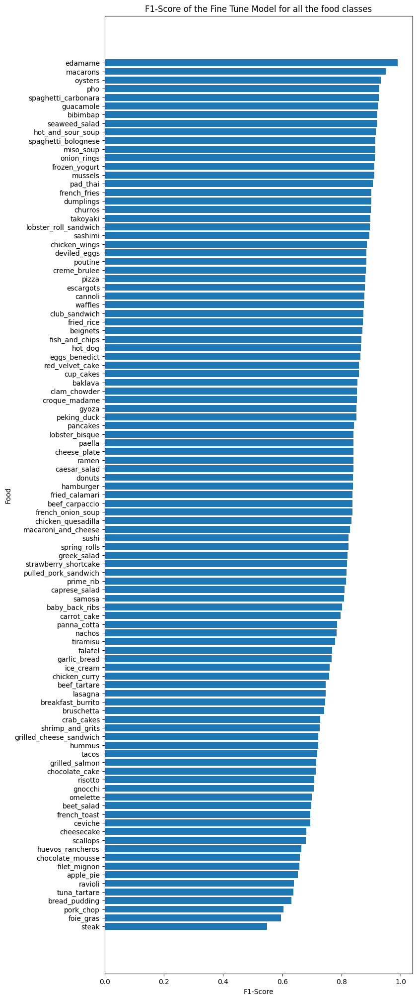

In [59]:
import matplotlib.pyplot as plt

# Create a horizontal bar plot to visualize the F1-score of the fine-tuned model for all food classes
plt.figure(figsize=(8,25))
plt.barh(food_metrics["Food"], food_metrics["f1-score"])
plt.title("F1-Score of the Fine Tune Model for all the food classes")
plt.ylabel("Food")
plt.xlabel("F1-Score")
# Invert the y-axis to display the highest F1-scores at the top
plt.gca().invert_yaxis()
plt.show()

## View a set of images and the actual and predicted labels

In [60]:
# Take the first 100 batches from the test_data dataset to create a smaller test set
test_set_of_100 = test_data.take(100)

In [61]:
# Initialize lists to store labels and images from the test set
label_test = []

image_test = []
# Iterate through the unbatched test_set_of_100 to extract images and labels
for image, label in test_set_of_100.unbatch():
  label_test.append(label)
  image_test.append(image.numpy())

We have create a list of image and label of 100 sample from test_data set

### Using the preprocess image function

In [62]:
import tensorflow as tf
def preprocess_img(image,img_shape=224):
  """
  Convert image data type from `uint8` -> `float32` and reshape
  image to [img_shape, img_shape, colour_channels]

  """

  # Resize the image to the target size
  image = tf.image.resize(image, size=[img_shape, img_shape])
  # Convert the image data type from uint8 to float32
  return tf.cast(image, tf.float32)

### Ploting a random image with it's actual label and predicted label

1/1 [==============================] - 0s 38ms/step


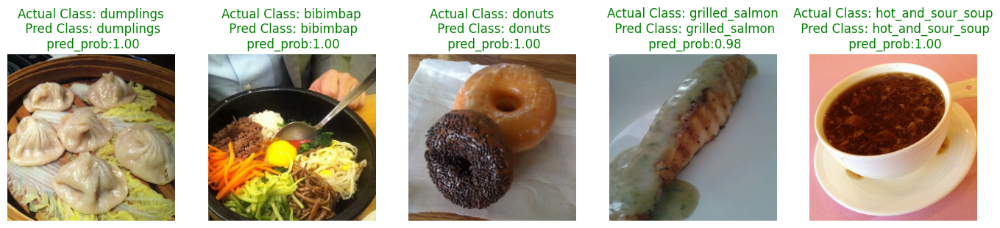

In [63]:
import random
import matplotlib.pyplot as plt

# Set the figure size for the plot
plt.figure(figsize=(17, 10))

# Generate 5 random indices to select images from the test set
for i in range(5):
  index = random.randint(0, 99)

  img = image_test[index]

  # Preprocessing the image

  img = preprocess_img(img, img_shape=224)

  # Get the true class name
  class_name = class_names[label_test[index].numpy()]

  # Get the predicted probabilities and class
  pred_probs = model.predict(tf.expand_dims(img, axis=0))
  y_preds = pred_probs.argmax()
  pred_class = class_names[y_preds]

  # Let's plot the image

  plt.subplot(1, 5, i+1)
  plt.imshow(img/255.0)
  # Set title color to green if the predicted class is correct, otherwise red
  if pred_class == class_name:
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"Actual Class: {class_name}\n Pred Class: {pred_class}\n pred_prob:{pred_probs.max():.2f}", c=title_color)
  plt.axis(False)

plt.show()

## Finding the Most Wrong Predictions

In [64]:
# Function to extract the numerical part of the filename
import re

def numerical_sort_key(value):
    numbers = re.findall(r'\d+', value)
    return int(numbers[0]) if numbers else 0

In [72]:
# Get the file paths
file_paths = []
for root, dirs, files in os.walk(save_dir):
    for file in files:
        file_paths.append(os.path.join(root, file))

# Sort the file paths numerically
file_paths.sort(key=numerical_sort_key)

file_paths[:10]

['images/image_0.png',
 'images/image_1.png',
 'images/image_2.png',
 'images/image_3.png',
 'images/image_4.png',
 'images/image_5.png',
 'images/image_6.png',
 'images/image_7.png',
 'images/image_8.png',
 'images/image_9.png']

In [81]:
# 2. Create a dataframe out of current prediction data for analysis
import pandas as pd
pred_df = pd.DataFrame({"img_path":file_paths,
                        "y_true": y_labels,
                        "y_pred": predictions,
                        "pred_conf": prediction_probs.max(axis=1), # get the maximum prediction probability value
                        "y_true_classname": [class_names[i] for i in y_labels],
                        "y_pred_classname": [class_names[i] for i in predictions]})

In [82]:
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,images/image_0.png,29,29,1.000000,cup_cakes,cup_cakes
1,images/image_1.png,81,81,1.000000,ramen,ramen
2,images/image_2.png,91,91,0.999996,spaghetti_carbonara,spaghetti_carbonara
3,images/image_3.png,53,53,0.999446,hamburger,hamburger
4,images/image_4.png,97,97,1.000000,takoyaki,takoyaki


In [83]:
pred_df["Correct_Pred"] = pred_df["y_true"]==pred_df["y_pred"]

In [84]:
# 4. Get the top 100 wrong examples
top_100_wrong = pred_df[pred_df["Correct_Pred"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,Correct_Pred
10477,images/image_10477.png,95,30,1.0,sushi,deviled_eggs,False
4544,images/image_4544.png,93,50,1.0,steak,grilled_salmon,False
832,images/image_832.png,50,26,1.0,grilled_salmon,crab_cakes,False
4918,images/image_4918.png,84,71,1.0,risotto,paella,False
13884,images/image_13884.png,46,10,1.0,garlic_bread,bruschetta,False
1113,images/image_1113.png,72,67,1.0,pancakes,omelette,False
1041,images/image_1041.png,99,85,1.0,tuna_tartare,samosa,False
2225,images/image_2225.png,43,20,1.0,fried_calamari,chicken_wings,False
22957,images/image_22957.png,87,30,1.0,scallops,deviled_eggs,False
9047,images/image_9047.png,85,92,1.0,samosa,spring_rolls,False


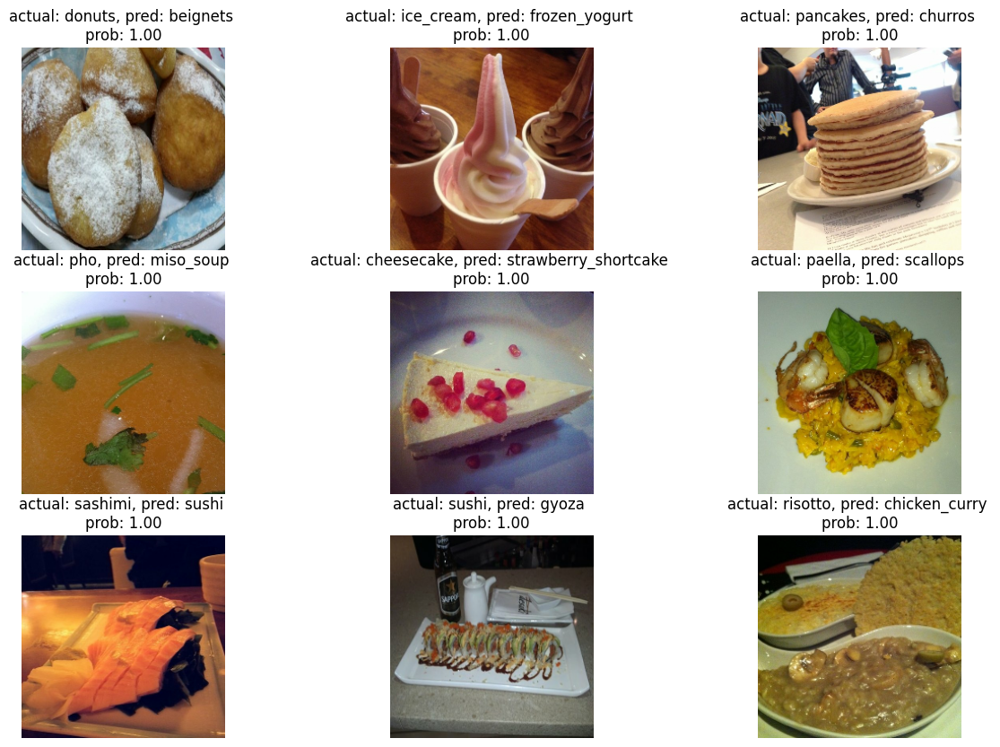

In [85]:
# 5. Visualize some of the most wrong examples
import matplotlib.image as mpimg
images_to_view = 9
start_index = 10 # change the start index to view more
plt.figure(figsize=(15, 10))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
  plt.subplot(3, 3, i+1)
  img = tf.io.read_file(row[1])
  img = tf.image.decode_jpeg(img)
  img = tf.cast(img, tf.float32)
  _, _, _, _, pred_prob, y_true, y_pred, _ = row # only interested in a few parameters of each row
  plt.imshow(img/255.0)
  plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
  plt.axis(False)


# Model Confusion Cases

Our model tends to confuse items that have similar visual features. Here are some specific examples:

1. **Paella and Scallops**
   - **Reason for confusion:** Paella often contains scallops, making it visually similar to a standalone dish of scallops.
   - **Distinguishing features:** Paella is a mixed rice dish with various ingredients, whereas scallops alone are typically served as individual pieces of seafood.

2. **Sashimi and Sushi**
   - **Reason for confusion:** Both sashimi and sushi can include raw fish slices, leading to visual similarity.
   - **Distinguishing features:** Sashimi is solely slices of raw fish, while sushi includes vinegared rice and often additional ingredients like seaweed or vegetables.

Understanding these nuances can help improve the model's accuracy by focusing on distinct visual characteristics.


## Viewing our experiment data on TensorBoard

In [86]:
log_dir = "Transfer_learning"
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>